<a href="https://colab.research.google.com/github/karinaah/NLP_222/blob/main/Tarea1_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tarea 1 de Machine Learning (28-05-22) - Clustering

En esta actividad se debe aplicar dbscan y hierarchical clustering para unos datos de videojuegos e interpretar sus resultados. Como ejemplo, se presenta los resultados para el modelo de k-means.

## [01] Pasos Preliminares

### [01.1] Importacion de Librerias

In [ ]:
import numpy as np
import pandas as pd

from plotnine import *
import plotly as plt
import plotly.express as px

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

### [02.2] Creacion de funciones/metodos utiles

#### [02.2.1] Funcion de EDA inicial de un df

In [ ]:
def Descriptivo_DF(
    df, # tabla (dataframe) que contiene los datos
    lista_vars = [], # # lista (['V1','V2',...]) que contiene nombre de columnas con variables a revisar
    N_categorias_int=10, # cantidad maxima de categorias distintas en variable numerica para considerarla como categorica
    mostrar_grafico = True, # parametro opcional para mostrar graficos 
    ancho=1000, # ancho predeterminado para los graficos
    alto=400 # alto predeterminado para los graficos
    ):
  
  #=====================================================================
  #[01] Determinar campos a revisar
  #=====================================================================

  if (len(lista_vars)==0):
    campos=df.columns
  else:
    campos=lista_vars

  #=====================================================================
  #[02] Comenzar a recorrer listado de campos a revisar 
  #=====================================================================

  i=0
  for var in campos:
    i=i+1

  #---------------------------------------------------------------------
  #[02.1] Determinar tipo de variable
  #---------------------------------------------------------------------

    if (str(df[var].dtypes)=='object'):
      Tipo_var='Categorica'
    elif (str(df[var].dtypes)=='float64'):
      Tipo_var='Numerica'
    elif (str(df[var].dtypes) in ['int64','int32'] and len(set(df[var]))<=N_categorias_int):
      Tipo_var='Categorica'
    else: 
      Tipo_var='Numerica'

  #---------------------------------------------------------------------
  #[02.2] Cuando Variable es Numerica
  #---------------------------------------------------------------------

    if (Tipo_var=='Numerica'):
      
      print(' ')
      print('______________________________________________________________')
      print('['+str(i)+'] '+var+' (tipo: '+Tipo_var+')')
      
      #________________
      # Indicadores 

      print(' ')
      display(pd.DataFrame(df[var].describe()).transpose())

      #________________
      # Visualizacion 

      if (mostrar_grafico):

        print(' ')

        # crear objeto 
        fig = px.histogram(
        df, 
        x=var,
        marginal= 'box', # or violin, rug
        )

        # Detalles adicionales sobre el grafico
        fig.update_layout(
            width=ancho,
            height=alto 
            )

        # Mostrar Objeto 
        fig.show()


  #---------------------------------------------------------------------
  #[02.3] Cuando es Variable Categorica
  #---------------------------------------------------------------------

    if (Tipo_var=='Categorica'):
      
      print(' ')
      print('______________________________________________________________')
      print('['+str(i)+'] '+var+' (tipo: '+Tipo_var+')')

      #________________
      # Indicadores 

      df_agg = df.groupby([var]).agg( # agrupar resultados 
      Conteo = pd.NamedAgg(column = var, aggfunc = len)
      )
      df_agg.reset_index(level=df_agg.index.names, inplace=True) # pasar indices a columnas

      df_agg['Porcentaje']=df_agg['Conteo']/df_agg['Conteo'].sum() # calcular porcentaje 

      df_agg = df_agg.sort_values(by=['Conteo'],ascending=False) # ordenar de mayor a menor 

      df_agg = df_agg.append(df_agg.sum(numeric_only=True), ignore_index=True) # agregar total 

      df_agg.loc[len(df_agg)-1,var]='TOTAL' # nombrar total 

      print(' ')
      display(df_agg)

      #________________
      # Visualizacion 

      if (mostrar_grafico):
        
        # Crear Objeto Grafico 
        fig = px.bar(
            df_agg[:(len(df_agg)-1)], # quitar total 
            x=var, 
            y='Conteo' 
            )

        # Detalles adicionales sobre el grafico
        fig.update_layout(
            width=ancho,
            height=alto 
            )

        # Mostrar Objeto 
        print(' ')
        fig.show()

#### [02.2.2] Funcion de Perfil/Analisis de Cluster con variables numericas

In [ ]:
def Perfil_Cluster_numerico(
    df, # tabla (dataframe) que contiene los datos
    campo_cluster, # texto que indica cual es el campo de cluster
    campos_input, # listado de campos numericos usados para clusterizar
    ):
    
    # Crear lista de entregables en blanco 
    entregable = []

    #====================================================================================================
    # [01] Agregar campos adicionales a tabla
    #====================================================================================================

    df_aux1 = df[[campo_cluster]+campos_input]

    #----------------------------------------------------------------------------------------------------
    # [01.1] Agregar Componentes Principales (3) a tabla 
    #----------------------------------------------------------------------------------------------------

    scaler = StandardScaler() #Creamos un objeto de la clase StandardScaler
    scaler_variables = scaler.fit_transform(df_aux1[campos_input]) #estandarización los datos (media 0, varianza 1)

    pca = PCA(n_components=3)
    pca.fit(scaler_variables)


    df_aux1['PC1']=[x[0] for x in pca.transform(scaler_variables)]
    df_aux1['PC2']=[x[1] for x in pca.transform(scaler_variables)]
    df_aux1['PC3']=[x[2] for x in pca.transform(scaler_variables)]


    #----------------------------------------------------------------------------------------------------
    # [01.2] Agregar Campo de nombre_cluster (Cluster + cantidad)
    #----------------------------------------------------------------------------------------------------

    df_aux1 = df_aux1.merge(
        df_aux1.groupby(campo_cluster)[campo_cluster].count().rename('Porcentaje').transform(lambda x: x/x.sum()).reset_index(), 
        on=campo_cluster, 
        how='left'
        )

    df_aux1['Cluster']=df_aux1[campo_cluster]+'\n ('+round(100*df_aux1['Porcentaje'],1).astype(str)+')'



    #====================================================================================================
    # [02] Generar tabla de resumen con promedios
    #====================================================================================================

    df_aux2 = df_aux1.groupby([campo_cluster]).size().reset_index(name='N')
    df_aux2['Porcentaje'] = round(100 * df_aux2['N']  / df_aux2['N'].sum(),2)

    df_aux2 = df_aux2.merge(
        df_aux1[[campo_cluster]+campos_input].groupby(campo_cluster).mean().round(2).reset_index(), 
        on=campo_cluster, 
        how='left'
        )

    df_aux2 = df_aux2.style.set_caption('Tabla resumen de casos por Cluster + valor promedio en cada variable') # titulo a cada variable

    entregable.append(df_aux2)


    #====================================================================================================
    # [03] Graficos de cada variable explicando composicion segun variable
    #====================================================================================================

    df_aux2 = df_aux1[campos_input+['Cluster']].melt(id_vars='Cluster')

    grafico1 = ggplot(df_aux2, aes(x='Cluster', y='value')) \
    + stat_summary(geom='geom_errorbar') +stat_summary(geom='point') \
    + facet_wrap('variable', scales='free_y') + theme(figure_size=(17,5),subplots_adjust={'wspace': 0.25}) \
    + ggtitle('Promedio y error por Variable y Cluster')


    entregable.append(grafico1)	


    #====================================================================================================
    # [04] Graficos de cajas por cada variable
    #====================================================================================================

    fig = px.box(
        df_aux2, 
        x='Cluster', 
        y='value', 
        color='Cluster', 
        facet_col='variable'
        )
    fig.update_yaxes(matches=None)
    fig.for_each_yaxis(lambda yaxis: yaxis.update(showticklabels=True))
    fig.update_layout(
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor='right',x=1),
        title = 'Grafico de cajas de cada variable por Cluster'
        )

    entregable.append(fig)	


    #====================================================================================================
    # [05] Graficos de dispersion de variables todas contra todas
    #====================================================================================================

    fig = px.scatter_matrix(
        df_aux1,
        dimensions=campos_input,
        color='Cluster'
    )
    fig.update_traces(diagonal_visible=False)

    fig.update_layout(
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor="right",x=1),
        title = 'Grafico de Dispersion cruzada entre las variables'
        )

    entregable.append(fig)


    #====================================================================================================
    # [06] Graficos de dispersion 2d segun componentes principales
    #====================================================================================================

    df_aux2=df_aux1[['PC1','PC2','PC3']+['Cluster']]

    fig = px.scatter(
        df_aux2, 
        x='PC1', 
        y='PC2', 
        color='Cluster', 
        symbol='Cluster'
        )

    fig.update_layout(
        xaxis_title='PC1 ('+str(round(100*pca.explained_variance_ratio_[0],1))+')',
        yaxis_title='PC2 ('+str(round(100*pca.explained_variance_ratio_[1],1))+')',
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor="right",x=1),
        title = 'Grafico de Dispersion 2D segun componentes principales'
        )


    entregable.append(fig)


    #====================================================================================================
    # [07] Graficos de dispersion 3d segun componentes principales
    #====================================================================================================

    fig = px.scatter_3d(
        df_aux2, 
        x='PC1', 
        y='PC2', 
        z='PC3', 
        color='Cluster', 
        symbol='Cluster'
        )

    fig.update_layout(
        scene = dict(
            xaxis_title='PC1 ('+str(round(100*pca.explained_variance_ratio_[0],1))+')',
            yaxis_title='PC2 ('+str(round(100*pca.explained_variance_ratio_[1],1))+')',
            zaxis_title='PC3 ('+str(round(100*pca.explained_variance_ratio_[2],1))+')'
        ),
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor='right',x=1),
            title = 'Grafico de Dispersion 3D segun componentes principales'
        )


    entregable.append(fig)


    #====================================================================================================
    # [08] Graficos de Ubicacion de variables de PCA en 2d
    #====================================================================================================

    # https://plotly.com/python/pca-visualization/

    df_aux2 = pd.DataFrame(pca.components_[0:2].transpose(),columns=['PC1','PC2'])
    df_aux2['Variable']=campos_input


    fig = px.scatter(
        df_aux2, 
        x='PC1', 
        y='PC2',
        hover_data=['Variable']

        )
    fig.update_traces(marker=dict(size=12))

    fig.update_layout(
        xaxis_title='PC1 ('+str(round(100*pca.explained_variance_ratio_[0],1))+')',
        yaxis_title='PC2 ('+str(round(100*pca.explained_variance_ratio_[1],1))+')',
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor="left",x=0),
        title = 'Grafico 2d de ubicacion de componentes principales'
        )

    entregable.append(fig)


    #====================================================================================================
    # [09] Graficos de Ubicacion de variables de PCA en 3d
    #====================================================================================================

    # https://plotly.com/python/pca-visualization/

    df_aux2 = pd.DataFrame(pca.components_[0:3].transpose(),columns=['PC1','PC2','PC3'])
    df_aux2['Variable']=campos_input

    fig = px.scatter_3d(
        df_aux2, 
        x='PC1', 
        y='PC2', 
        z='PC3', 
        hover_data=['Variable']
        )

    fig.update_layout(
        scene = dict(
            xaxis_title='PC1 ('+str(round(100*pca.explained_variance_ratio_[0],1))+')',
            yaxis_title='PC2 ('+str(round(100*pca.explained_variance_ratio_[1],1))+')',
            zaxis_title='PC3 ('+str(round(100*pca.explained_variance_ratio_[2],1))+')'
        ),
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor='right',x=1),
        title = 'Grafico 3d de ubicacion de componentes principales'
        )


    entregable.append(fig)

    #====================================================================================================
    # [10] Graficos de dispersion 2d + ubicacion componentes principales
    #====================================================================================================

    df_aux2a=df_aux1[['PC1','PC2']+['Cluster']]
    df_aux2a['Variable']=df_aux2a['Cluster']
    df_aux2a['Size']=1

    df_aux2b = pd.DataFrame(pca.components_[0:2].transpose(),columns=['PC1','PC2'])
    df_aux2b['Cluster']='Variables PCA'
    df_aux2b['Variable']=campos_input
    df_aux2b['Size']=4

    fig = px.scatter(
        pd.concat([df_aux2a,df_aux2b]), 
        x='PC1', 
        y='PC2', 
        color='Cluster', 
        symbol='Cluster',
        size='Size',
        hover_data=['Variable']
        )

    fig.update_layout(
        xaxis_title='PC1 ('+str(round(100*pca.explained_variance_ratio_[0],1))+')',
        yaxis_title='PC2 ('+str(round(100*pca.explained_variance_ratio_[1],1))+')',
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor="right",x=1),
        title = 'Grafico de Dispersion 2D + ubicacion componentes principales'
        )


    entregable.append(fig)


    #====================================================================================================
    # [11] Graficos de dispersion 3d + ubicacion componentes principales
    #====================================================================================================

    df_aux2a=df_aux1[['PC1','PC2','PC3']+['Cluster']]
    df_aux2a['Variable']=df_aux2a['Cluster']
    df_aux2a['Size']=1

    df_aux2b = pd.DataFrame(pca.components_[0:3].transpose(),columns=['PC1','PC2','PC3'])
    df_aux2b['Cluster']='Variables PCA'
    df_aux2b['Variable']=campos_input
    df_aux2b['Size']=4


    fig = px.scatter_3d(
        pd.concat([df_aux2a,df_aux2b]), 
        x='PC1', 
        y='PC2', 
        z='PC3', 
        color='Cluster', 
        symbol='Cluster',
        size='Size',
        hover_data=['Variable']
        )

    fig.update_layout(
        scene = dict(
            xaxis_title='PC1 ('+str(round(100*pca.explained_variance_ratio_[0],1))+')',
            yaxis_title='PC2 ('+str(round(100*pca.explained_variance_ratio_[1],1))+')',
            zaxis_title='PC3 ('+str(round(100*pca.explained_variance_ratio_[2],1))+')'
        ),
        legend=dict( orientation="h",yanchor="bottom",y=1.08,xanchor='right',x=1),
        title = 'Grafico 3D + ubicacion de componentes principales'
        )


    entregable.append(fig)
    
    #====================================================================================================
    # [12] Retornar Entregable
    #====================================================================================================
    
    return entregable

## [02] Importacion de datos

### [02.1] Lectura y limpieza de datos

In [ ]:
df=pd.read_csv("Data.csv")

display(df.sample(5))
print('--------------------------------------------------')
display(df.info())
print('--------------------------------------------------')
display(df.describe())

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
11789,Sony Computer Science Kenkyuujo Mogi Kenichiro...,PSP,2006.0,Misc,Sega,0.00,0.00,0.07,0.00,0.07,NaN,NaN,NaN,NaN,NaN,NaN
8655,Trigger Man,PS2,2004.0,Shooter,Play It,0.08,0.06,0.00,0.02,0.16,32.0,4.0,4.8,16.0,Point of View,T
1360,Rayman Raving Rabbids,Wii,2006.0,Misc,Ubisoft,1.22,0.06,0.02,0.11,1.42,76.0,54.0,7.9,116.0,Ubisoft Montpellier,E
10985,Prinny: Can I Really Be the Hero?,PSP,2008.0,Platform,Tecmo Koei,0.03,0.00,0.05,0.01,0.09,72.0,45.0,7,41.0,Nippon Ichi Software,T
10486,Family Fun Football,Wii,2009.0,Sports,Tecmo Koei,0.10,0.00,0.00,0.01,0.10,NaN,NaN,tbd,NaN,"Seamless Entertainment, Inc.",E


--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: floa

None

--------------------------------------------------


,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count
count,16450.000000,16719.000000,16719.000000,16719.000000,16719.000000,16719.000000,8137.000000,8137.000000,7590.000000
mean,2006.487356,0.263330,0.145025,0.077602,0.047332,0.533543,68.967679,26.360821,162.229908
std,5.878995,0.813514,0.503283,0.308818,0.186710,1.547935,13.938165,18.980495,561.282326
min,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000,13.000000,3.000000,4.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000,60.000000,12.000000,10.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000,71.000000,21.000000,24.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,0.470000,79.000000,36.000000,81.000000
max,2020.000000,41.360000,28.960000,10.220000,10.570000,82.530000,98.000000,113.000000,10665.000000


In [ ]:
df2=df.dropna() #Eliminando datos con valores NA 
df2.reset_index()
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6825 entries, 0 to 16706
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             6825 non-null   object 
 1   Platform         6825 non-null   object 
 2   Year_of_Release  6825 non-null   float64
 3   Genre            6825 non-null   object 
 4   Publisher        6825 non-null   object 
 5   NA_Sales         6825 non-null   float64
 6   EU_Sales         6825 non-null   float64
 7   JP_Sales         6825 non-null   float64
 8   Other_Sales      6825 non-null   float64
 9   Global_Sales     6825 non-null   float64
 10  Critic_Score     6825 non-null   float64
 11  Critic_Count     6825 non-null   float64
 12  User_Score       6825 non-null   object 
 13  User_Count       6825 non-null   float64
 14  Developer        6825 non-null   object 
 15  Rating           6825 non-null   object 
dtypes: float64(9), object(7)
memory usage: 906.4+ KB


In [ ]:
df2['User_Score']=df2['User_Score'].astype(float)
df2['User_Score'].info()

<class 'pandas.core.series.Series'>
Int64Index: 6825 entries, 0 to 16706
Series name: User_Score
Non-Null Count  Dtype  
--------------  -----  
6825 non-null   float64
dtypes: float64(1)
memory usage: 106.6 KB


### [02.2] Analisis Exploratorio de los datos

In [ ]:
Descriptivo_DF(
    df2, # tabla (dataframe) que contiene los datos
    df2.columns, # # lista (['V1','V2',...]) que contiene nombre de columnas con variables a revisar
    N_categorias_int=10, # cantidad maxima de categorias distintas en variable numerica para considerarla como categorica
    mostrar_grafico = True, # parametro opcional para mostrar graficos 
    ancho=1000, # ancho predeterminado para los graficos
    alto=400 # alto predeterminado para los graficos
    )

 
______________________________________________________________
[1] Name (tipo: Categorica)
 


C:\Users\sebas\AppData\Local\Temp\ipykernel_9620\2507102507.py:102: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Name,Conteo,Porcentaje
0,Need for Speed: Most Wanted,8.0,0.001172
1,Madden NFL 07,8.0,0.001172
2,LEGO Star Wars II: The Original Trilogy,8.0,0.001172
3,Harry Potter and the Order of the Phoenix,7.0,0.001026
4,The Sims 2,7.0,0.001026
...,...,...,...
4373,Imperial Glory,1.0,0.000147
4374,Imperium Romanum,1.0,0.000147
4375,Impossible Creatures,1.0,0.000147
4376,uDraw Studio: Instant Artist,1.0,0.000147


 
______________________________________________________________
[2] Platform (tipo: Categorica)
 


C:\Users\sebas\AppData\Local\Temp\ipykernel_9620\2507102507.py:102: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Platform,Conteo,Porcentaje
0,PS2,1140.0,0.167033
1,X360,858.0,0.125714
2,PS3,769.0,0.112674
3,PC,651.0,0.095385
4,XB,565.0,0.082784
5,Wii,479.0,0.070183
6,DS,464.0,0.067985
7,PSP,390.0,0.057143
8,GC,348.0,0.050989
9,PS4,239.0,0.035018


 
______________________________________________________________
[3] Year_of_Release (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
Year_of_Release,6825.0,2007.436777,4.211248,1985.0,2004.0,2007.0,2011.0,2016.0


 
______________________________________________________________
[4] Genre (tipo: Categorica)
 


C:\Users\sebas\AppData\Local\Temp\ipykernel_9620\2507102507.py:102: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Genre,Conteo,Porcentaje
0,Action,1630.0,0.238828
1,Sports,943.0,0.138168
2,Shooter,864.0,0.126593
3,Role-Playing,712.0,0.104322
4,Racing,581.0,0.085128
5,Platform,403.0,0.059048
6,Misc,384.0,0.056264
7,Fighting,378.0,0.055385
8,Simulation,297.0,0.043516
9,Strategy,267.0,0.039121


 
______________________________________________________________
[5] Publisher (tipo: Categorica)
 


C:\Users\sebas\AppData\Local\Temp\ipykernel_9620\2507102507.py:102: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Publisher,Conteo,Porcentaje
0,Electronic Arts,944.0,0.138315
1,Ubisoft,496.0,0.072674
2,Activision,492.0,0.072088
3,Sony Computer Entertainment,316.0,0.046300
4,THQ,307.0,0.044982
...,...,...,...
258,Lighthouse Interactive,1.0,0.000147
259,Max Five,1.0,0.000147
260,Maxis,1.0,0.000147
261,inXile Entertainment,1.0,0.000147


 
______________________________________________________________
[6] NA_Sales (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
NA_Sales,6825.0,0.394484,0.967385,0.0,0.06,0.15,0.39,41.36


 
______________________________________________________________
[7] EU_Sales (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
EU_Sales,6825.0,0.236089,0.68733,0.0,0.02,0.06,0.21,28.96


 
______________________________________________________________
[8] JP_Sales (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
JP_Sales,6825.0,0.064158,0.28757,0.0,0.0,0.0,0.01,6.5


 
______________________________________________________________
[9] Other_Sales (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
Other_Sales,6825.0,0.082677,0.269871,0.0,0.01,0.02,0.07,10.57


 
______________________________________________________________
[10] Global_Sales (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
Global_Sales,6825.0,0.77759,1.963443,0.01,0.11,0.29,0.75,82.53


 
______________________________________________________________
[11] Critic_Score (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
Critic_Score,6825.0,70.272088,13.868572,13.0,62.0,72.0,80.0,98.0


 
______________________________________________________________
[12] Critic_Count (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
Critic_Count,6825.0,28.931136,19.224165,3.0,14.0,25.0,39.0,113.0


 
______________________________________________________________
[13] User_Score (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
User_Score,6825.0,7.185626,1.439942,0.5,6.5,7.5,8.2,9.6


 
______________________________________________________________
[14] User_Count (tipo: Numerica)
 


,count,mean,std,min,25%,50%,75%,max
User_Count,6825.0,174.722344,587.428538,4.0,11.0,27.0,89.0,10665.0


 
______________________________________________________________
[15] Developer (tipo: Categorica)
 


C:\Users\sebas\AppData\Local\Temp\ipykernel_9620\2507102507.py:102: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Developer,Conteo,Porcentaje
0,EA Canada,149.0,0.021832
1,EA Sports,142.0,0.020806
2,Capcom,126.0,0.018462
3,Ubisoft,103.0,0.015092
4,Konami,95.0,0.013919
...,...,...,...
1285,Kronos Digital Entertainment,1.0,0.000147
1286,"LDW, Big Fish Games",1.0,0.000147
1287,Lab Rats Games,1.0,0.000147
1288,zSlide,1.0,0.000147


 
______________________________________________________________
[16] Rating (tipo: Categorica)
 


C:\Users\sebas\AppData\Local\Temp\ipykernel_9620\2507102507.py:102: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Rating,Conteo,Porcentaje
0,T,2377.0,0.348278
1,E,2082.0,0.305055
2,M,1433.0,0.209963
3,E10+,930.0,0.136264
4,AO,1.0,0.000147
5,K-A,1.0,0.000147
6,RP,1.0,0.000147
7,TOTAL,6825.0,1.000000


## [03] Aplicar Distintos metodos de clusterizacion en los datos

In [ ]:
# Seleccionar un dataframe solo de variables numericas

# Como paso preliminar, volcar los valores numericos en un df aparte y normalizar
cols_numericas = df2.select_dtypes([np.number]).columns.tolist()

df2n = df2[cols_numericas]

scaler = StandardScaler() #Creamos un objeto de la clase StandardScaler
scaler_variables = scaler.fit_transform(df2n) #estandarización los datos (media 0, varianza 1)
df2ne = pd.DataFrame(scaler_variables, columns=df2n.columns)

#display(df2ne.info())
display(df2ne.describe())

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count
count,6.825000e+03,6.825000e+03,6.825000e+03,6.825000e+03,6.825000e+03,6.825000e+03,6825.000000,6.825000e+03,6.825000e+03,6825.000000
mean,8.290186e-15,-3.331482e-17,-1.665741e-17,6.662965e-17,-6.662965e-17,-6.662965e-17,0.000000,-3.331482e-17,7.329261e-16,0.000000
std,1.000073e+00,1.000073e+00,1.000073e+00,1.000073e+00,1.000073e+00,1.000073e+00,1.000073,1.000073e+00,1.000073e+00,1.000073
min,-5.328212e+00,-4.078131e-01,-3.435128e-01,-2.231215e-01,-3.063797e-01,-3.909694e-01,-4.129934,-1.348981e+00,-4.643324e+00,-0.290648
25%,-8.161544e-01,-3.457857e-01,-3.144126e-01,-2.231215e-01,-2.693222e-01,-3.400347e-01,-0.596507,-7.767427e-01,-4.761836e-01,-0.278731
50%,-1.037243e-01,-2.527446e-01,-2.562121e-01,-2.231215e-01,-2.322648e-01,-2.483523e-01,0.124601,-2.045043e-01,2.183399e-01,-0.251491
75%,8.461826e-01,-4.635015e-03,-3.796035e-02,-1.883447e-01,-4.697746e-02,-1.405275e-02,0.701487,5.237992e-01,7.045063e-01,-0.145939
max,2.033566e+00,4.234974e+01,4.179363e+01,2.238176e+01,3.886336e+01,4.164033e+01,1.999481,4.373403e+00,1.676839e+00,17.859272


In [ ]:
# Seleccionar un dataframe solo de variables categoricas

cols_categoricas = df2.select_dtypes(include=['object']).columns.to_list()

cols_categoricas.remove('Name')

df2c = df2[cols_categoricas]

df2c.describe()

,Platform,Genre,Publisher,Developer,Rating
count,6825,6825,6825,6825,6825
unique,17,12,262,1289,7
top,PS2,Action,Electronic Arts,EA Canada,T
freq,1140,1630,944,149,2377


In [ ]:
# Crear una copia de df original trabajable (df2) donde se iran almacenando los clusters

df3 = df2.copy()

### [03.1] Clusterizacion: K-means

#### [03.1.1] Clusterizacion: K-means --> Aplicacion

In [ ]:
# Generar inicialmente Grafico del codo para seleccionar mejor cantidad de cluster

sse = [] 
numK = 18
for k in range(1, numK): 
    
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df2ne)
    sse.append(kmeans.inertia_)

km_codo = pd.DataFrame(columns=['k','Inercia'])
km_codo['k']=np.arange(1,numK)
km_codo['Inercia']=sse

fig = px.line(
    km_codo, 
    x='k', 
    y='Inercia'
    )
fig.show()

In [ ]:
# crear cluster indicando numero de cluster
n_clusters_km = 5

kmeans = KMeans(n_clusters=n_clusters_km)
kmeans.fit(df2ne)

KMeans(n_clusters=5)

In [ ]:
# Agregar como variable a data frame
df3['Cluster1_KM']=kmeans.labels_.astype(str)

df3.groupby(['Cluster1_KM']).size().reset_index(name='N')

,Cluster1_KM,N
0,0,256
1,1,1981
2,2,1829
3,3,15
4,4,2744


#### [03.1.2] Clusterizacion: K-means --> Revision

In [ ]:
entregable1 = Perfil_Cluster_numerico(
    df = df3,
    campo_cluster= 'Cluster1_KM',
    campos_input=cols_numericas    
)

In [ ]:
entregable1[0]

,Cluster1_KM,N,Porcentaje,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count
0,0,256,3.750000,2008.800000,2.520000,1.870000,0.520000,0.620000,5.520000,86.460000,59.890000,7.560000,1827.730000
1,1,1981,29.030000,2010.870000,0.390000,0.240000,0.060000,0.080000,0.770000,77.710000,43.090000,7.470000,263.030000
2,2,1829,26.800000,2008.350000,0.160000,0.080000,0.010000,0.030000,0.290000,54.320000,17.590000,5.580000,42.750000
3,3,15,0.220000,2007.070000,12.170000,8.720000,3.160000,3.700000,27.750000,81.270000,59.130000,7.900000,604.530000
4,4,2744,40.210000,2004.220000,0.290000,0.140000,0.040000,0.050000,0.520000,73.960000,23.220000,8.010000,42.370000


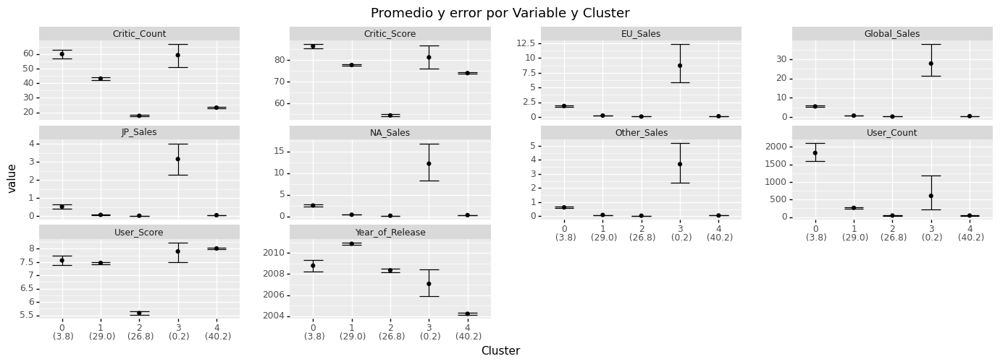

<ggplot: (137669430775)>

In [ ]:
entregable1[1]

In [ ]:
entregable1[2]

In [ ]:
entregable1[3]

In [ ]:
entregable1[4]

In [ ]:
entregable1[5]

In [ ]:
entregable1[6]

In [ ]:
entregable1[7]

In [ ]:
entregable1[8]

In [ ]:
entregable1[9]

### [03.2] Clusterizacion: DBScan

#### [03.2.1] Clusterizacion: DBScan --> Aplicacion


#### [03.2.2] Clusterizacion: DBScan --> Revision

### [03.3] Clusterizacion: Hierarchical

#### [03.3.1] Clusterizacion: Hierarchical --> Aplicacion

#### [03.3.2] Clusterizacion: Hierarchical --> Revision

### [03.4] Clusterizacion: C-means

#### [03.4.1] Clusterizacion: C-means --> Aplicacion

#### [03.4.2] Clusterizacion: C-means --> Revision

### [03.5] Clusterizacion: GMM

#### [03.5.1] Clusterizacion: GMM --> Aplicacion

#### [03.6.1] Clusterizacion: GMM --> Revision

### [03.6] Clusterizacion: K-modes

#### [03.6.1] Clusterizacion: K-modes --> Aplicacion

#### [03.6.2] Clusterizacion: K-modes --> Revision

### [03.7] Clusterizacion: Hierarchical Categorical

#### [03.7.1] Clusterizacion: Hierarchical Categorical --> Aplicacion

#### [03.7.2] Clusterizacion: Hierarchical Categorical --> Revision

## [04] Comparacion de los Metodos de Clusterizacion